In [ ]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python numpy torch torchvision matplotlib

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-eaoowvk0
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-eaoowvk0
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=812d63cc9cfbcb6b2bd5d58e5d3eb1000e15eb50e9a3ab2463a51945163118f4
  Stored in directory: /tmp/pip-ephem-wheel-cache-2tkzpbox/wheels/15/d7/bd/05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment_anything
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 64.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install onnxruntime onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 44.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.2 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
import torch

# Configuration

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SAM_CHECKPOINT = "/content/sam_vit_h.pth"

In [ ]:
def load_sam_model():
    print(f"Loading SAM model on {DEVICE}...")
    sam = sam_model_registry["vit_h"](checkpoint=SAM_CHECKPOINT).to(DEVICE)
    mask_generator = SamAutomaticMaskGenerator(
        sam,
        points_per_side=16,
        pred_iou_thresh=0.86,
        stability_score_thresh=0.92,
        min_mask_region_area=100
    )
    return mask_generator

# Improved Dark Channel Prior

In [ ]:
def dark_channel_prior(img, window_size=15):
    """Compute dark channel prior"""
    # Convert to float
    img_float = img.astype(np.float32) / 255.0

    # Compute minimum across channels
    min_channel = np.min(img_float, axis=2)

    # Apply minimum filter to find dark channel
    kernel = np.ones((window_size, window_size), np.uint8)
    dark = cv2.erode(min_channel, kernel)

    return dark

In [ ]:
def estimate_atmospheric_light(img, dark_channel, top_percent=0.001):
    """Estimate atmospheric light using brightest pixels in dark channel"""
    size = dark_channel.size
    num_pixels = max(1, int(size * top_percent))

    # Flatten and find indices of brightest pixels
    flat_dark = dark_channel.flatten()
    indices = np.argsort(flat_dark)[-num_pixels:]

    # Map indices to original image
    h, w = dark_channel.shape
    atmospheric_light = np.zeros(3)
    # Calculate atmospheric light as the average of brightest pixels
    for idx in indices:
        row, col = idx // w, idx % w
        atmospheric_light += img[row, col]

    return atmospheric_light / num_pixels

In [ ]:
def estimate_transmission(dark_channel, atmospheric_light, omega=0.95):
    """Estimate transmission map"""
    # Normalize atmospheric light to 0-1 range
    a_light_norm = atmospheric_light / 255.0

    # Calculate maximum across channels for atmospheric light
    a_light_max = np.max(a_light_norm)

    # Estimate transmission
    transmission = 1 - omega * (dark_channel / a_light_max)

    return transmission

In [ ]:
def guided_filter(guide, src, radius=60, eps=0.01):
    """Edge-preserving guided filter for refining transmission map"""
    # Convert to float
    I = guide.astype(np.float32) / 255.0
    p = src.astype(np.float32)

    # Mean of guide and source
    mean_I = cv2.boxFilter(I, -1, (radius, radius))
    mean_p = cv2.boxFilter(p, -1, (radius, radius))

    # Mean of guide * source
    mean_Ip = cv2.boxFilter(I * p, -1, (radius, radius))

    # Variance and covariance
    cov_Ip = mean_Ip - mean_I * mean_p

    # Mean of guide squared
    mean_II = cv2.boxFilter(I * I, -1, (radius, radius))

    # Variance of guide
    var_I = mean_II - mean_I * mean_I

    # Regularization
    a = cov_Ip / (var_I + eps)
    b = mean_p - a * mean_I

    # Mean of a and b
    mean_a = cv2.boxFilter(a, -1, (radius, radius))
    mean_b = cv2.boxFilter(b, -1, (radius, radius))

    # Output
    q = mean_a * I + mean_b

    return q

In [ ]:
def recover_image(img, transmission, atmospheric_light, t_min=0.1):
    """Recover dehazed image using transmission map and atmospheric light"""
    # Ensure transmission is at least t_min
    transmission = np.maximum(transmission, t_min)

    # Recover image
    result = np.zeros_like(img, dtype=np.float32)

    for i in range(3):
        result[:, :, i] = ((img[:, :, i].astype(np.float32) - atmospheric_light[i]) / transmission) + atmospheric_light[i]

    # Clip values to valid range
    result = np.clip(result, 0, 255).astype(np.uint8)

    return result

# SAM-based region segmentation

In [ ]:
def segment_image(mask_generator, image):
    """Segment image using SAM and identify key regions"""
    # Generate masks
    masks = mask_generator.generate(image)
    print(f"Generated {len(masks)} masks")

    # Create a region mask (0: background/unknown, 1: sky, 2: train/transportation, 3: building)
    region_mask = np.zeros(image.shape[:2], dtype=np.uint8)

    # For visualization
    segmentation_vis = np.zeros((*image.shape[:2], 3), dtype=np.uint8)

    # Basic classifier for mask types - can be improved with more sophisticated methods
    for i, mask_data in enumerate(masks):
        mask = mask_data['segmentation'].astype(np.uint8)

        # Skip very small masks
        if np.sum(mask) < image.shape[0] * image.shape[1] * 0.01:
            continue

        # Extract region and analyze
        region = np.zeros_like(image)
        region[mask > 0] = image[mask > 0]

        # Only consider non-zero pixels
        non_zero_pixels = region[region > 0]
        if len(non_zero_pixels) == 0:
            continue

        region_mean = np.mean(non_zero_pixels.reshape(-1, 3), axis=0)
        region_std = np.std(non_zero_pixels.reshape(-1, 3), axis=0)

        # Position-based classification (simple heuristic)
        mask_y, mask_x = np.where(mask > 0)
        center_y = np.mean(mask_y) / image.shape[0]  # Normalized center y-position

        # Convert position and color features to region type
        if center_y < 0.3 and np.sum(region_std) < 50:  # Upper part with low variance
            region_mask[mask > 0] = 1  # Sky
            segmentation_vis[mask > 0] = [135, 206, 235]  # Sky blue
        elif np.mean(region_std) > 40:  # High variance suggests detailed structure (train/tracks)
            region_mask[mask > 0] = 2  # Train/transportation
            segmentation_vis[mask > 0] = [255, 165, 0]  # Orange
        else:  # Default to buildings/environment
            region_mask[mask > 0] = 3  # Building/environment
            segmentation_vis[mask > 0] = [50, 205, 50]  # Lime green

    return region_mask, segmentation_vis

# Region-aware dehazing

In [ ]:
def dehaze_with_regions(image, region_mask):
    """Apply dehazing with region-specific parameters"""
    # Convert to float for processing
    img_float = image.astype(np.float32)

    # Step 1: Calculate dark channel prior
    dark_channel = dark_channel_prior(image, window_size=15)

    # Step 2: Estimate atmospheric light (A)
    atmospheric_light = estimate_atmospheric_light(image, dark_channel)

    # Create region-specific transmission maps
    transmission = estimate_transmission(dark_channel, atmospheric_light, omega=0.95)

    # Refine transmission with guided filter
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY).astype(np.float32) / 255.0
    refined_transmission = guided_filter(gray_image, transmission, radius=60, eps=0.01)

    # Adjust transmission based on regions
    region_adjusted_transmission = refined_transmission.copy()

    # Sky regions: Allow more haze to remain (more natural)
    region_adjusted_transmission[region_mask == 1] *= 0.8

    # Train/transportation regions: More aggressive dehazing
    region_adjusted_transmission[region_mask == 2] = np.power(
        region_adjusted_transmission[region_mask == 2], 0.8
    )

    # Buildings/environment: Standard dehazing
    # No adjustment needed

    # Recover the dehazed image
    dehazed = recover_image(image, region_adjusted_transmission, atmospheric_light, t_min=0.1)

    # Fine-tune colors
    dehazed_hsv = cv2.cvtColor(dehazed, cv2.COLOR_RGB2HSV).astype(np.float32)

    # Slightly boost saturation globally
    dehazed_hsv[:, :, 1] = np.clip(dehazed_hsv[:, :, 1] * 1.2, 0, 255)

    # Apply stronger saturation boost to transportation areas
    dehazed_hsv[:, :, 1][region_mask == 2] = np.clip(
        dehazed_hsv[:, :, 1][region_mask == 2] * 1.1, 0, 255
    )

    # Convert back to RGB
    final_dehazed = cv2.cvtColor(dehazed_hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)

    # Perform a final contrast stretch, preserving colors
    p5, p95 = np.percentile(cv2.cvtColor(final_dehazed, cv2.COLOR_RGB2GRAY), (5, 95))

    # Avoid division by zero
    if p95 > p5:
        for i in range(3):
            channel = final_dehazed[:, :, i].astype(np.float32)
            channel = 255 * (channel - p5) / (p95 - p5)
            final_dehazed[:, :, i] = np.clip(channel, 0, 255).astype(np.uint8)

    return final_dehazed, dark_channel, refined_transmission

# Main function

In [ ]:
!wget -O sam_vit_h.pth https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

--2025-03-31 23:39:19--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.226.210.25, 13.226.210.15, 13.226.210.78, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.226.210.25|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h.pth’

sam_vit_h.pth       100%[===================>]   2.39G   150MB/s    in 19s     

2025-03-31 23:39:38 (128 MB/s) - ‘sam_vit_h.pth’ saved [2564550879/2564550879]



In [ ]:
mask_generator = load_sam_model()

Loading SAM model on cuda...


In [ ]:
def main(image_path, mask_generator):
    """Main function for region-aware dehazing"""
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image from {image_path}")
        return None
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Segment the image
    print("Segmenting image...")
    region_mask, segmentation_vis = segment_image(mask_generator, image_rgb)

    # Apply dehazing
    print("Applying dehazing...")
    dehazed, dark_channel, transmission = dehaze_with_regions(image_rgb, region_mask)

    # Visualize results
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    # Original image
    axs[0, 0].imshow(image_rgb)
    axs[0, 0].set_title('Original Image')
    axs[0, 0].axis('off')

    # Region segmentation
    axs[0, 1].imshow(segmentation_vis)
    axs[0, 1].set_title('Region Segmentation')
    axs[0, 1].axis('off')

    # Dark channel
    axs[0, 2].imshow(dark_channel, cmap='gray')
    axs[0, 2].set_title('Dark Channel Prior')
    axs[0, 2].axis('off')

    # Transmission map
    axs[1, 0].imshow(transmission, cmap='jet')
    axs[1, 0].set_title('Refined Transmission Map')
    axs[1, 0].axis('off')

    # Region mask (color coded => in a future work it can be assigned dynamically)
    region_vis = np.zeros((*region_mask.shape, 3), dtype=np.uint8)
    region_vis[region_mask == 1] = [135, 206, 235]  # Sky: blue
    region_vis[region_mask == 2] = [255, 165, 0]    # Train: orange
    region_vis[region_mask == 3] = [50, 205, 50]    # Building: green
    axs[1, 1].imshow(region_vis)
    axs[1, 1].set_title('Region Classification')
    axs[1, 1].axis('off')

    # Dehazed result
    axs[1, 2].imshow(dehazed)
    axs[1, 2].set_title('Dehazed Result')
    axs[1, 2].axis('off')

    plt.tight_layout()
    # plt.savefig('dehazing_results.png')

    # Also save a direct comparison
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(dehazed)
    plt.title('Dehazed Result')
    plt.axis('off')

    plt.tight_layout()
    # plt.savefig('before_after.png')

    # Save dehazed image
    cv2.imwrite('dehazed_output.jpg', cv2.cvtColor(dehazed, cv2.COLOR_RGB2BGR))

    print("Dehazing complete. Results saved.")
    return dehazed, region_mask, segmentation_vis

Segmenting image...
Generated 84 masks
Applying dehazing...
Dehazing complete. Results saved.


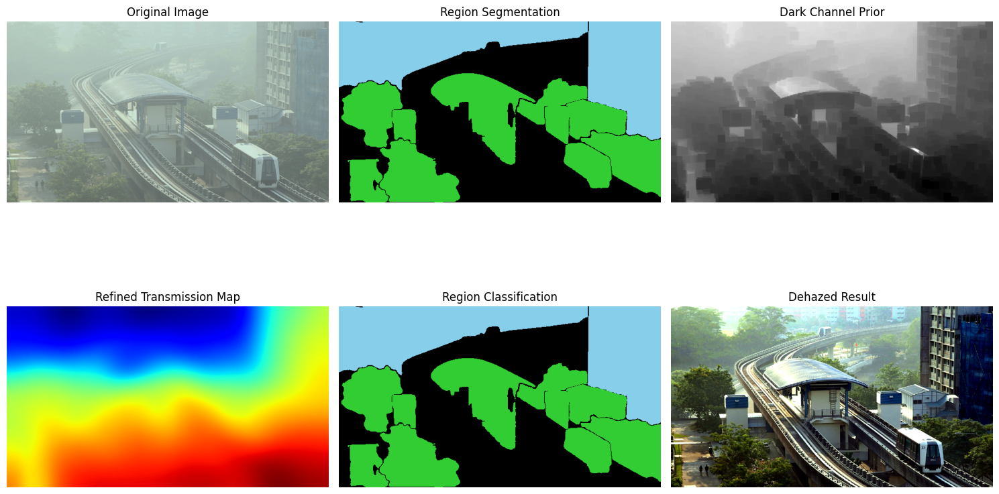

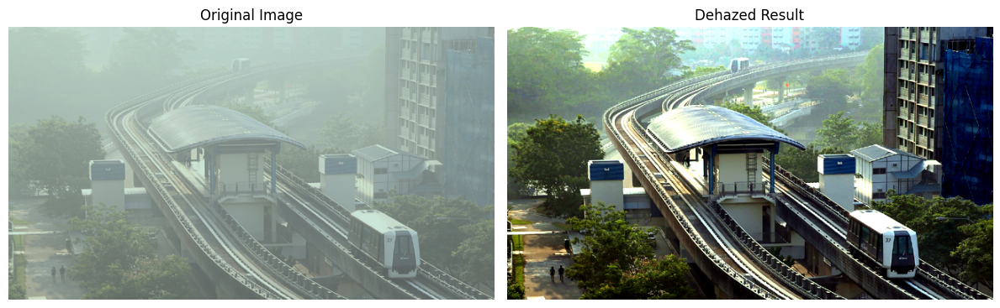

In [ ]:
image_path = "/content/2.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 26 masks
Applying dehazing...
Dehazing complete. Results saved.


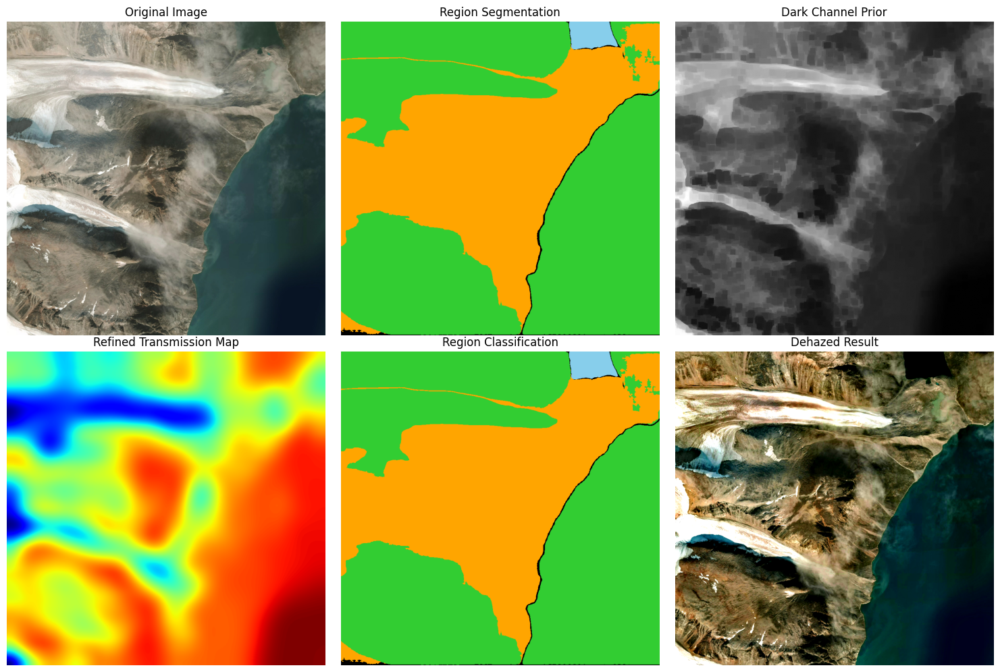

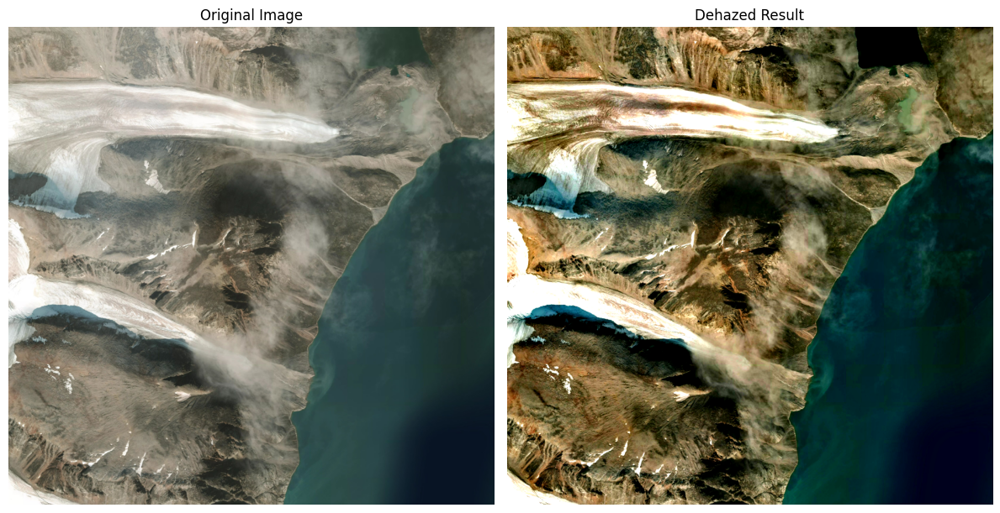

In [ ]:
image_path = "/content/in0.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 99 masks
Applying dehazing...
Dehazing complete. Results saved.


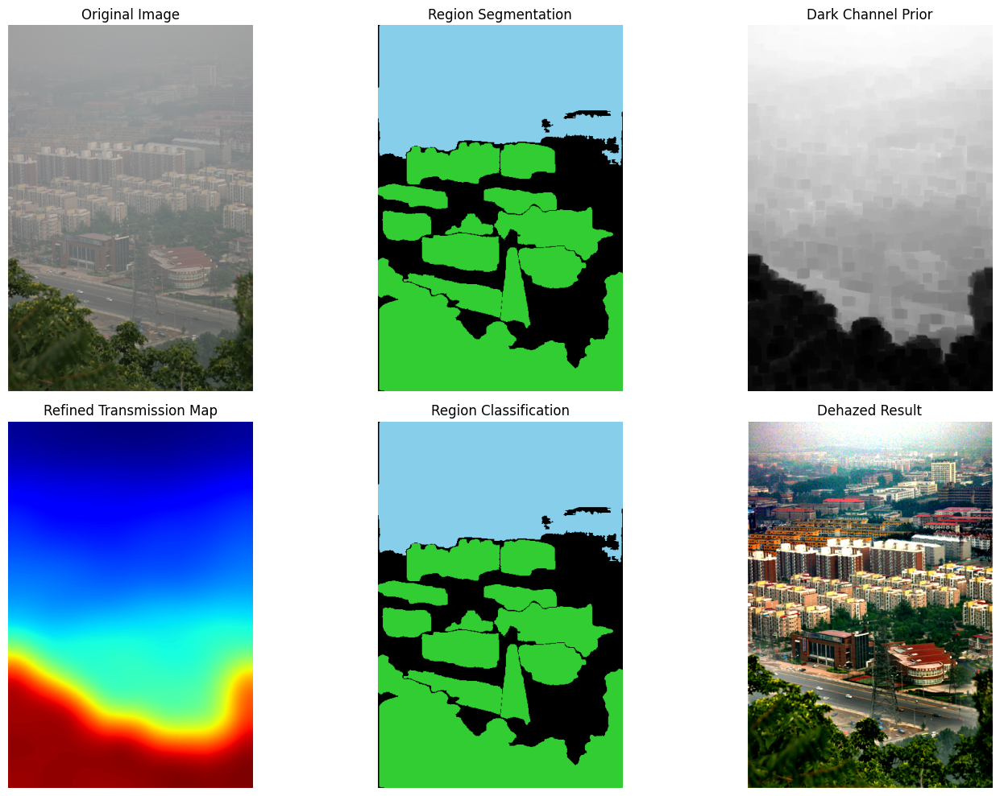

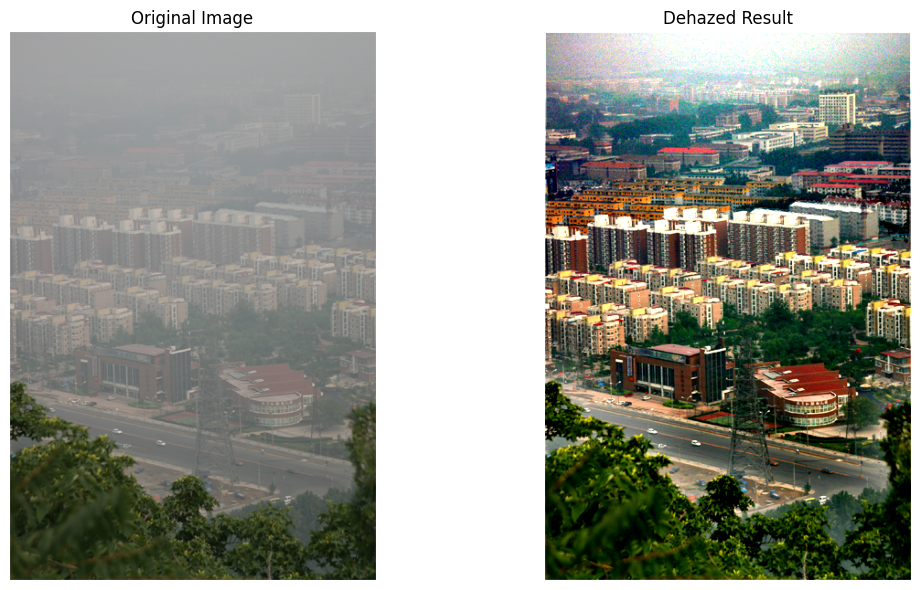

In [ ]:
image_path = "/content/3.bmp"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 56 masks
Applying dehazing...
Dehazing complete. Results saved.


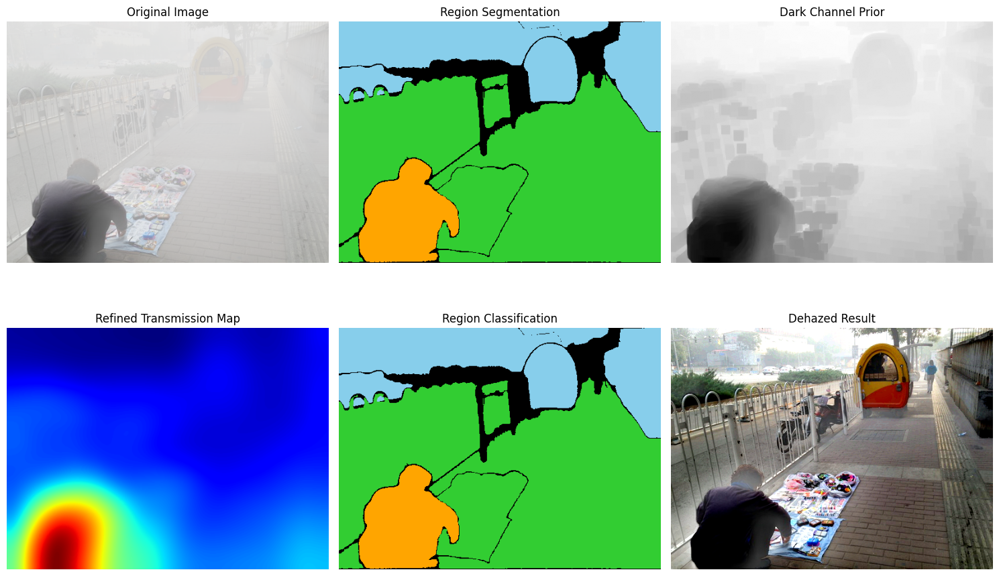

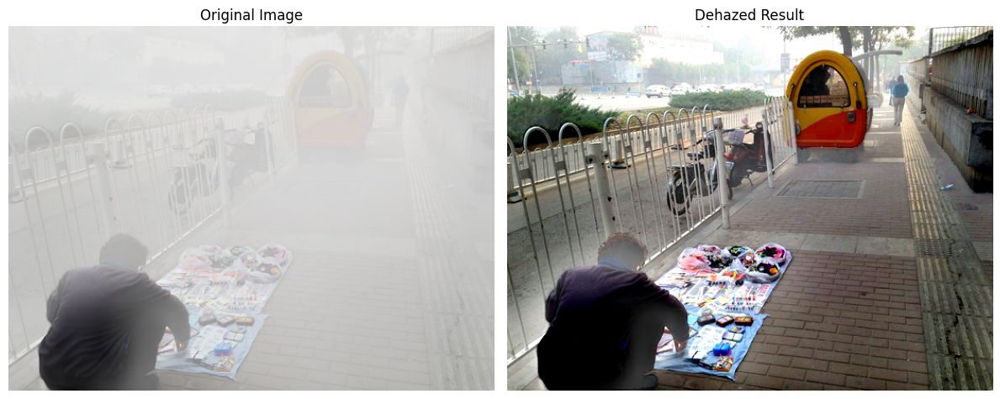

In [ ]:
image_path = "/content/0323.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 62 masks
Applying dehazing...
Dehazing complete. Results saved.


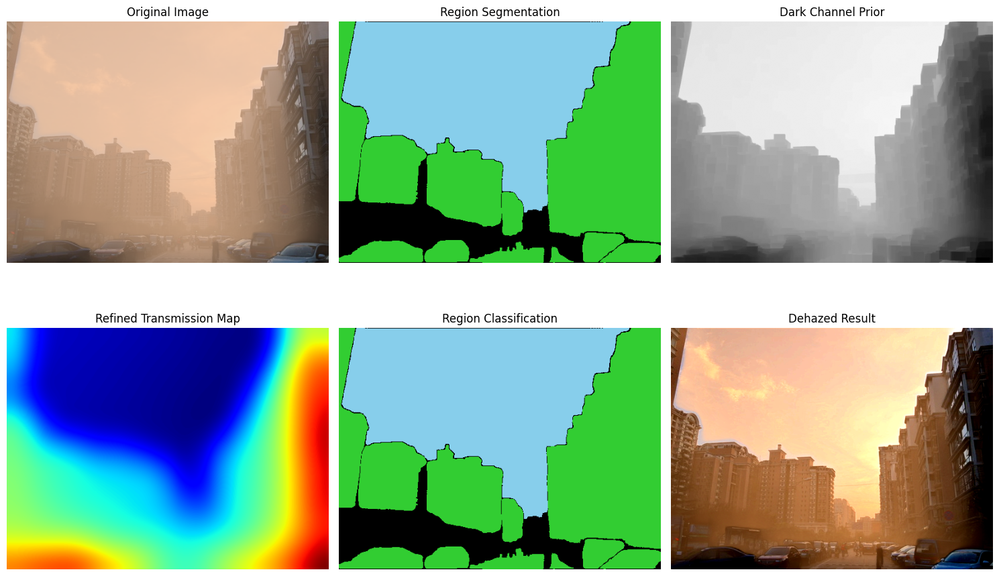

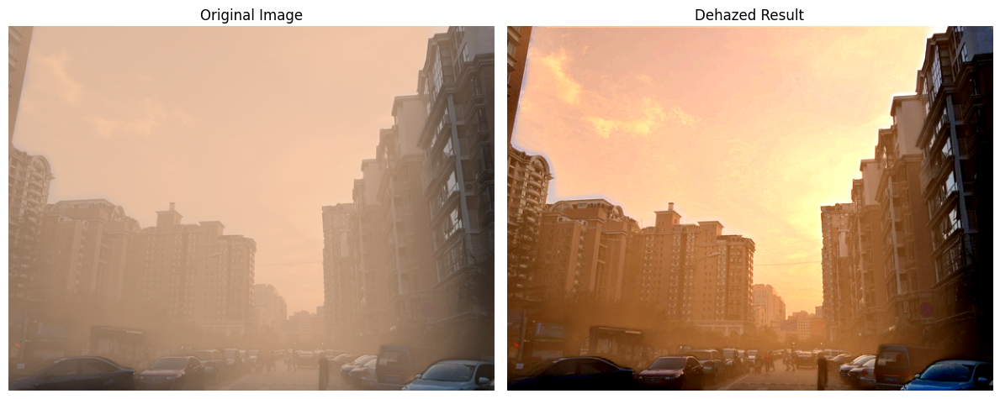

In [ ]:
image_path = "/content/1852.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 63 masks
Applying dehazing...
Dehazing complete. Results saved.


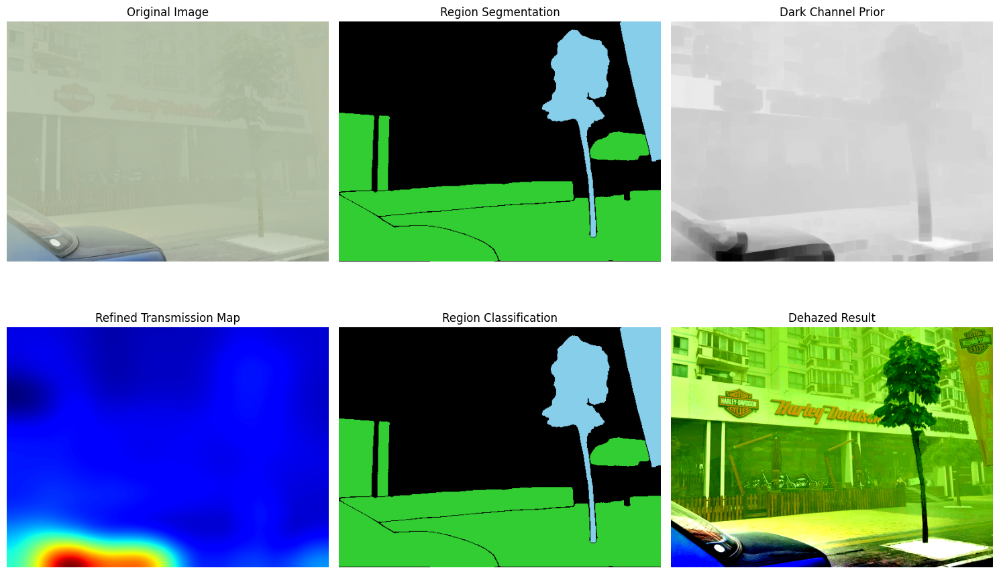

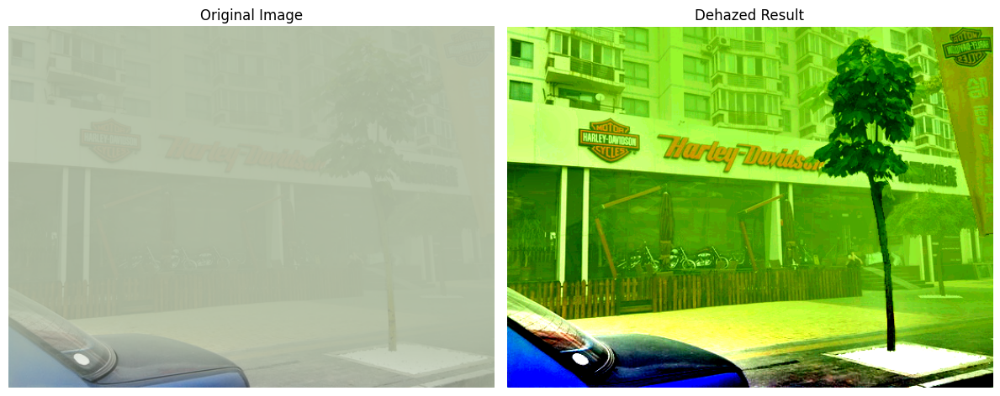

In [ ]:
image_path = "/content/1867.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)

Segmenting image...
Generated 41 masks
Applying dehazing...
Dehazing complete. Results saved.


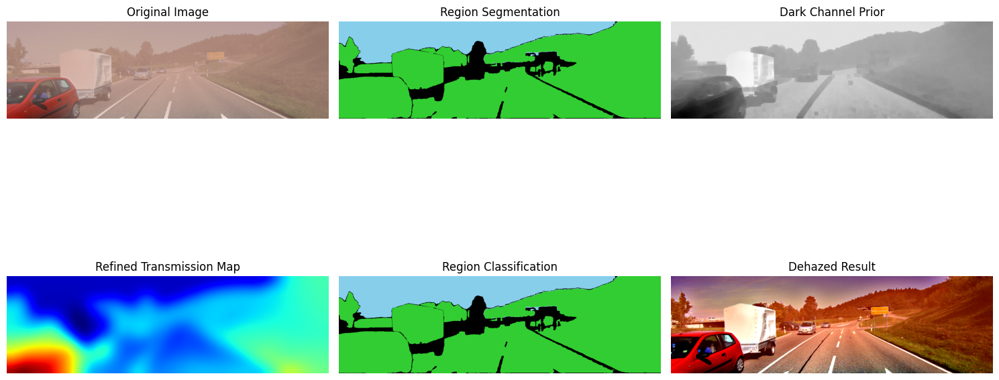

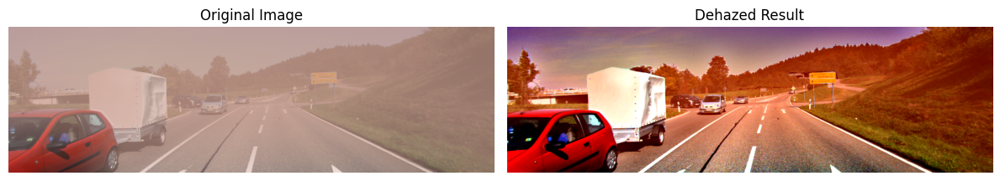

In [ ]:
image_path = "/content/000116_2_3_red.png"
dehazed, region_mask, segmentation_vis = main(image_path, mask_generator)